In [1]:
import numpy as np
import proplot as pplt
import meds
import healpy as hp
import fitsio
import glob

%matplotlib notebook

In [2]:
d = fitsio.read("DES0455-5123_r5366p01_metadetect.fits.fz")

In [3]:
gm = hp.read_map("y6a2_foreground_mask_v1.1.fits", nest=True)

In [4]:
nestinds = hp.ang2pix(4096, d['ra'], d['dec'], nest=True, lonlat=True)

<IPython.core.display.Javascript object>


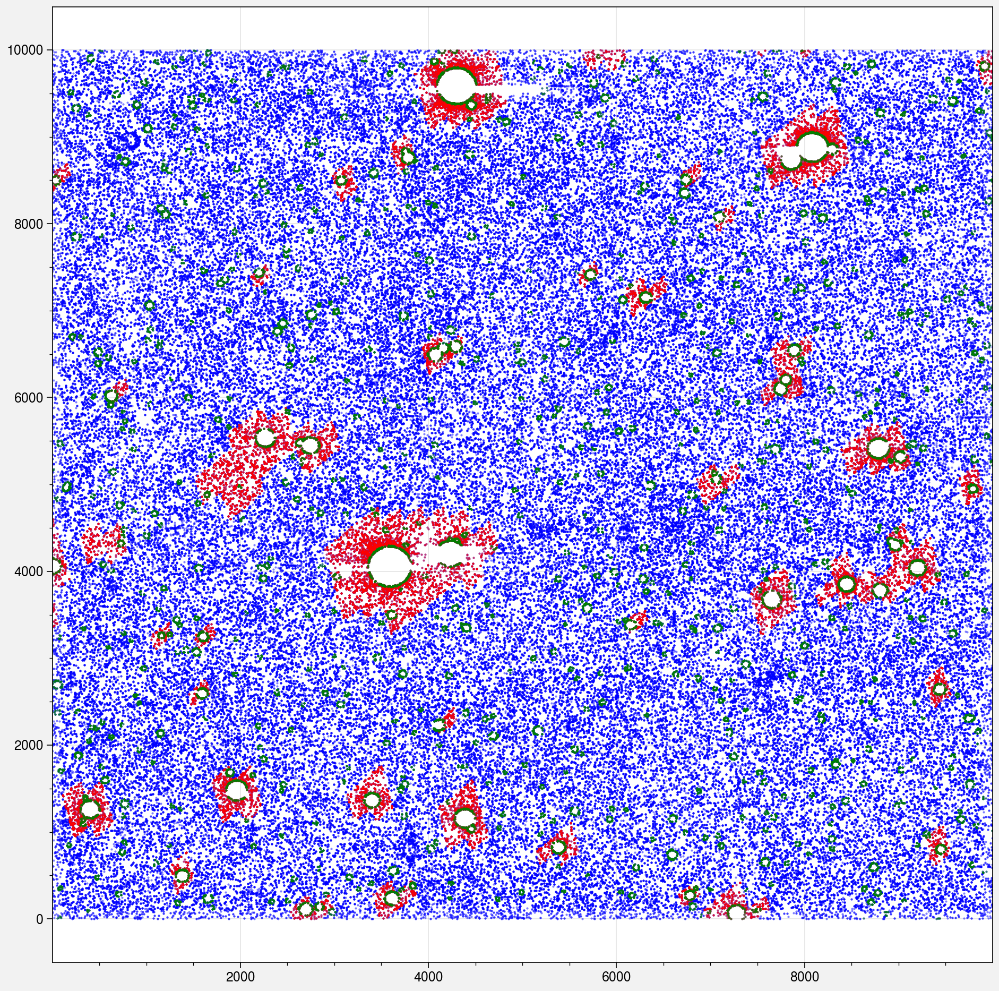

In [5]:
msk = (d["tilename"] == "DES0455-5123") & (d['mdet_step'] == 'noshear')
mdet_msk = msk & ((d["mask_flags"] & 4) != 0)
gold_msk = msk & (gm[nestinds] > 0)
fig, axs = pplt.subplots(refwidth=4, refaspect=1)

axs.plot(d["col"][msk], d["row"][msk], '.b', markersize=1, alpha=0.5)
axs.plot(d["col"][gold_msk], d["row"][gold_msk], '.r', markersize=1, alpha=0.5)
axs.plot(d["col"][mdet_msk], d["row"][mdet_msk], '.g', markersize=1, alpha=0.5)


In [7]:
img = fitsio.read("DES0455-5123_r5366p01_r_pizza-cutter-slices-coadd-img.fits.fz")

[139218933 139218933 139218933 139218933 139218933 139218933 139218933
 139218933 139218933 139218933 139218933 139218933 139218933 139218933
 139218933 139218933 139218933 139218933 139218933 139218933 139218933
 139218933 139218933 139218933 139218933 139218933 139218933 139218933
 139218933 139218933 139218933 139218933 139218933 139218933 139218933
 139218933 139218933 139218933 139218933 139218933 139218933 139218933
 139218933 139218933]


<IPython.core.display.Javascript object>


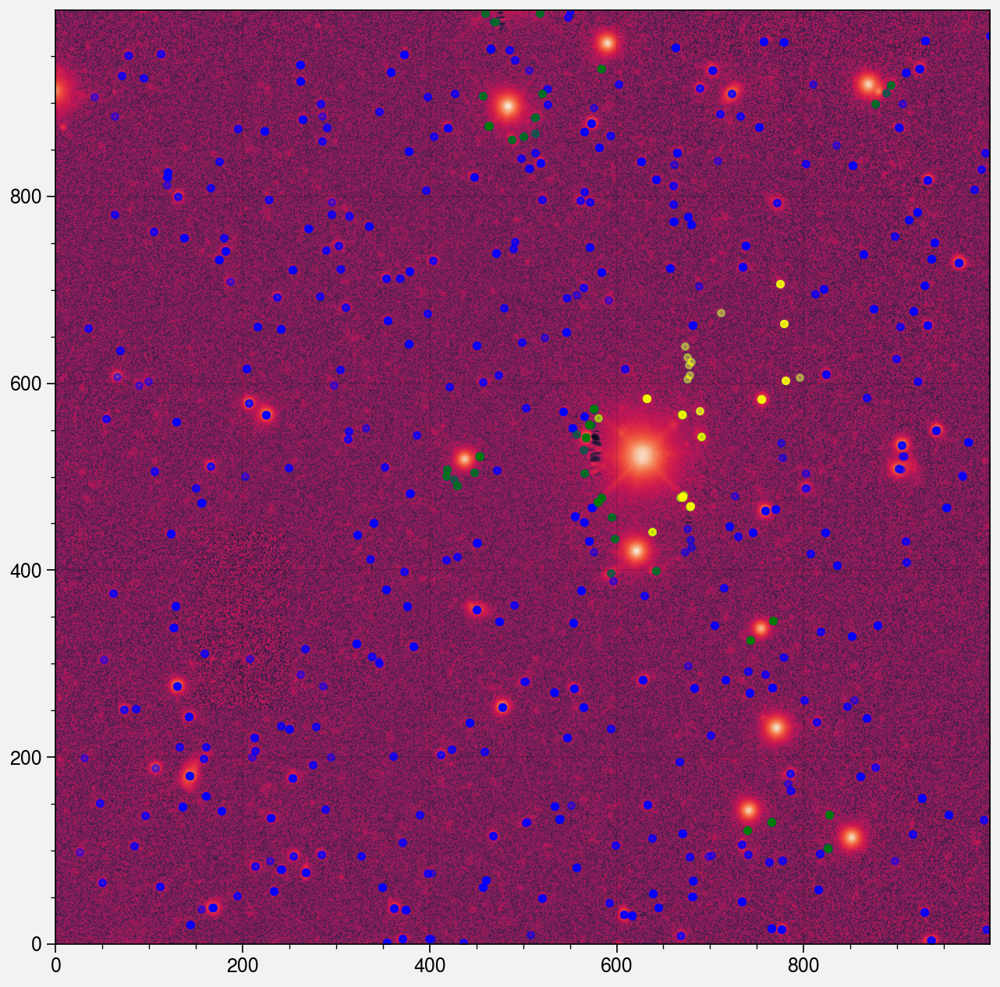

In [12]:
msk = (
    (d["tilename"] == "DES0455-5123") 
    & (d['mdet_step'] == 'noshear')
    & (d['row'] > 5500)
    & (d['row'] < 6500)
    & (d['col'] > 0)
    & (d['col'] < 1000)
    & (d["mdet_s2n"] > 10)
)
mdet_msk = msk & ((d["mask_flags"] & 4) != 0)
gold_msk = msk & (gm[nestinds] > 0)
print(nestinds[gold_msk])

fig, axs = pplt.subplots()
axs.imshow(np.arcsinh(img[5500:6500, 0:1000]), origin="lower", cmap="rocket")
axs.plot(d["col"][msk]-0, d["row"][msk]-5500, '.b', alpha=0.5)
axs.plot(d["col"][mdet_msk]-0, d["row"][mdet_msk]-5500, '.g', alpha=0.5)
axs.plot(d["col"][gold_msk]-0, d["row"][gold_msk]-5500, '.', color='yellow', alpha=0.5)
fig.savefig("odd_mask.png")

In [11]:
for ra, dec in list(zip(d["ra"][gold_msk], d["dec"][gold_msk])):
    print(ra,dec)


74.50583120465636 -51.31344302140408
74.50106627924919 -51.31144174950271
74.50203415990751 -51.31072832765853
74.50590006077844 -51.31341339459928
74.50107400882716 -51.31145378785843
74.50202974373919 -51.31071590164981
74.50106924279399 -51.311432815994884
74.50203286624128 -51.310738597266145
74.50196582659288 -51.30431394587957
74.50642620441351 -51.3030039617196
74.50230019042262 -51.31076696310661
74.5018814760415 -51.31058869505846
74.5011604260026 -51.31148923524797
74.49964574924516 -51.30601305179155
74.50204501387898 -51.30424540783123
74.49979055851712 -51.30399653726968
74.5064197036347 -51.30300392308897
74.49205075538032 -51.30313662798051
74.49205121902294 -51.303136592579754
74.5124561301131 -51.30447369855023
74.50202657500995 -51.30428681038605
74.50641921102125 -51.303002956515
74.50112300800093 -51.30043233481528
74.50079288858747 -51.30017055371045
74.50133793046048 -51.29978680525122
74.50138056149068 -51.30148905151963
74.50103391433646 -51.301209961060636
74.5

In [9]:
np.unique(gm[nestinds[gold_msk]])

array([16.], dtype=float32)

<IPython.core.display.Javascript object>


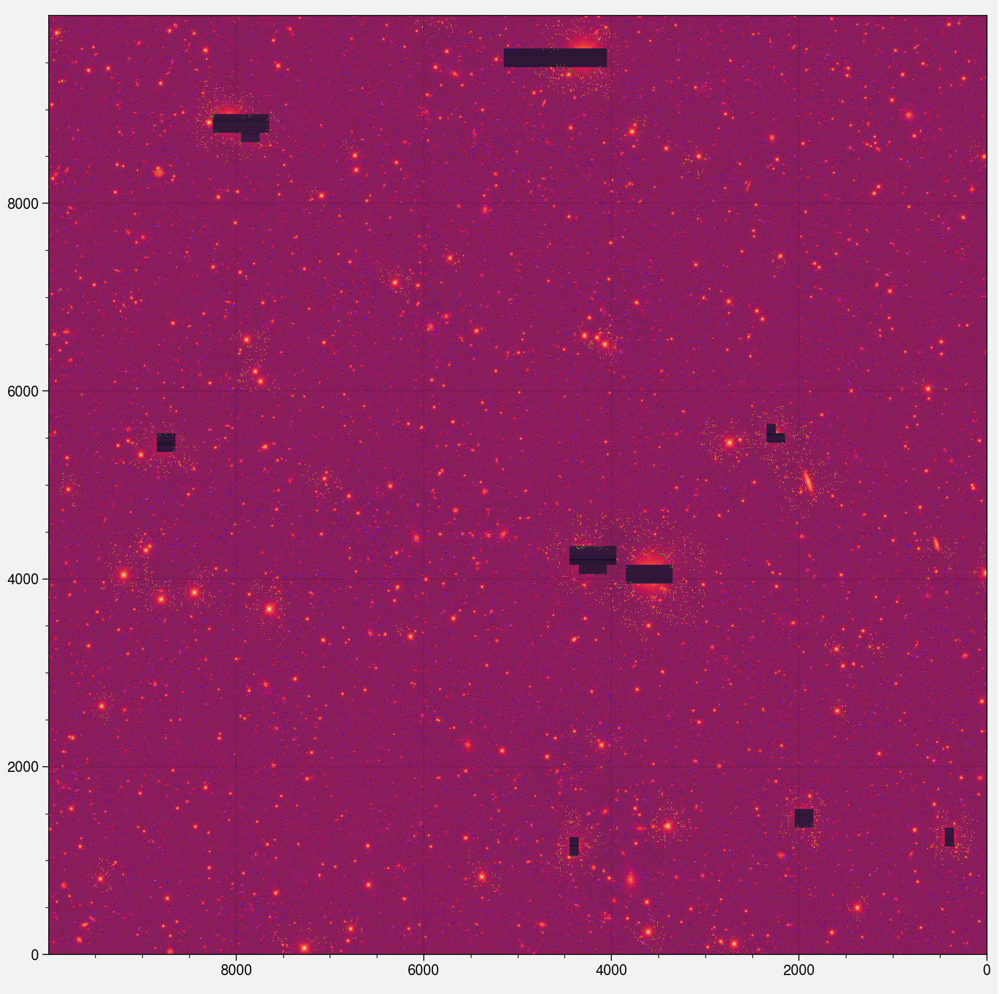

In [36]:
msk = (
    (d["tilename"] == "DES0455-5123") 
    & (d['mdet_step'] == 'noshear')
    & (d["mdet_s2n"] > 10)
)
mdet_msk = msk & ((d["mask_flags"] & 4) != 0)
gold_msk = msk & (gm[nestinds] > 0)

ms = 0.5

fig, axs = pplt.subplots(refwidth=8, refaspect=1)
axs.imshow(np.arcsinh(img), origin="lower", cmap="rocket")
axs.plot(d["col"][msk]-0, d["row"][msk]-0, '.b', markersize=ms, markeredgewidth=0)
axs.plot(d["col"][gold_msk]-0, d["row"][gold_msk]-0, '.', color='yellow', markersize=ms, markeredgewidth=0)
axs.plot(d["col"][mdet_msk]-0, d["row"][mdet_msk]-0, '.g', markersize=ms, markeredgewidth=0)
fig.savefig("odd_mask_big.png", dpi=300)

In [ ]:
np.any((d["MASK_FLAGS"] & 4) != 0)

In [ ]:
fig, axs = pplt.subplots(refwidth=8, refaspect=1)


axs.hexbin(d["ICOL"][msk], d["IROW"][msk], bins=1000, cmap='rocket_r')

In [ ]:
fig, axs = pplt.subplots(refwidth=8, refaspect=1)

axs.plot(d["ICOL"][msk], d["IROW"][msk], '.', markersize=1)

In [ ]:
dc = fitsio.read("DES0420-6039_r5366p01_metadetect.fits.fz")

In [ ]:
dc.dtype.names

In [ ]:
fig, axs = pplt.subplots()

msk = (
    (
        (d["slice_id"] == (54)) 
        |
        (d["slice_id"] == (54+99)) 
        |
        (d["slice_id"] == (55)) 
        |
        (d["slice_id"] == (55+99))
    )
    & ((d['bmask'] & 2**24) != 0)
    & (d["mdet_s2n"] > 10)
)
axs.plot(d["col"][msk], d["row"][msk], '.')
axs.set_aspect(1)

In [ ]:
54+99

In [ ]:
dn = fitsio.read("DES0420-6039_metadetect-v4_mdetcat_range0153-0154.fits.fz")

In [ ]:
dn.dtype.descr

In [26]:
fig.savefig?